# LAB02 Assigment Template




### Exercise 0  Importing the census 

In [1]:
# Import libraries necessary for this project
import numpy as np
import pandas as pd
from time import time
from IPython.display import display  # Allows the use of display() for DataFrames
# 'Matplotlib' is a data visualization library for 2D and 3D plots, built on numpy
from matplotlib import pyplot as plt
%matplotlib inline

# 'Seaborn' is based on matplotlib; used for plotting statistical graphics
import seaborn as sns

# to suppress warnings
import warnings
warnings.filterwarnings("ignore") 


# Pretty display for notebooks
%matplotlib inline

data = pd.read_csv("census.csv")

data.head()


FileNotFoundError: [Errno 2] No such file or directory: 'census.csv'

### Exercise 1  Exploration 

通过打印数据的shape的行信息可以得到表项数据的总行数

同时也可以通过数据的 info 方法获取 entry 的数据条数

则记录条数为 45222 条

In [ ]:
# The total number of records
data.shape[0]
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45222 entries, 0 to 45221
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   age              45222 non-null  int64  
 1   workclass        45222 non-null  object 
 2   education_level  45222 non-null  object 
 3   education-num    45222 non-null  float64
 4   marital-status   45222 non-null  object 
 5   occupation       45222 non-null  object 
 6   relationship     45222 non-null  object 
 7   race             45222 non-null  object 
 8   sex              45222 non-null  object 
 9   capital-gain     45222 non-null  float64
 10  capital-loss     45222 non-null  float64
 11  hours-per-week   45222 non-null  float64
 12  native-country   45222 non-null  object 
 13  income           45222 non-null  object 
dtypes: float64(4), int64(1), object(9)
memory usage: 4.8+ MB


可以通过筛选条件，筛选出年收入>50K的表项，人数为11208

In [ ]:
# The number of individuals making more than $50000 annually
len(data[data['income'] == '>50K'])

11208

同理，通过筛选条件，筛选出年收入值为'<=50K'的表项，人数为34014

In [ ]:
# The number of individuals making at most $50000 annually
len(data[data['income'] == '<=50K'])

34014

将年收入为'>50K'的表项除以总数据条数，得到年收入为'>50K'人的占比为0.2478439697492371，即 24.8%

In [ ]:
# The percentage of individuals making at more than $50000 annually
percentage = len(data[data['income']=='>50K'])/data.shape[0]
print(percentage)

0.2478439697492371


可以通过 <某一列>.unique()的方法来展示每一列的特征值，这里通过遍历data的所有列，并对其调用 unique() 方法来获取每一列的数据

In [ ]:
# Feature values for each column
for col in data.columns:
    print(data[col].unique())

[39 50 38 53 28 37 49 52 31 42 30 23 32 34 25 43 40 54 35 59 56 19 20 45
 22 48 21 24 57 44 41 29 47 46 36 79 27 18 33 76 55 61 70 64 71 66 51 58
 26 17 60 90 75 65 77 62 63 67 74 72 69 68 73 81 78 88 80 84 83 85 82 86
 89 87]
[' State-gov' ' Self-emp-not-inc' ' Private' ' Federal-gov' ' Local-gov'
 ' Self-emp-inc' ' Without-pay']
[' Bachelors' ' HS-grad' ' 11th' ' Masters' ' 9th' ' Some-college'
 ' Assoc-acdm' ' 7th-8th' ' Doctorate' ' Assoc-voc' ' Prof-school'
 ' 5th-6th' ' 10th' ' Preschool' ' 12th' ' 1st-4th']
[13.  9.  7. 14.  5. 10. 12.  4. 16. 11. 15.  3.  6.  1.  8.  2.]
[' Never-married' ' Married-civ-spouse' ' Divorced'
 ' Married-spouse-absent' ' Separated' ' Married-AF-spouse' ' Widowed']
[' Adm-clerical' ' Exec-managerial' ' Handlers-cleaners' ' Prof-specialty'
 ' Other-service' ' Sales' ' Transport-moving' ' Farming-fishing'
 ' Machine-op-inspct' ' Tech-support' ' Craft-repair' ' Protective-serv'
 ' Armed-Forces' ' Priv-house-serv']
[' Not-in-family' ' Husband' ' Wife' ' 

### Exercise 2 Preprocessing 

通过调用sns 的 distplot 方法以及 box 方法，依次绘制出'capital-gain'和'capital-loss'的数据的倾斜连续特征

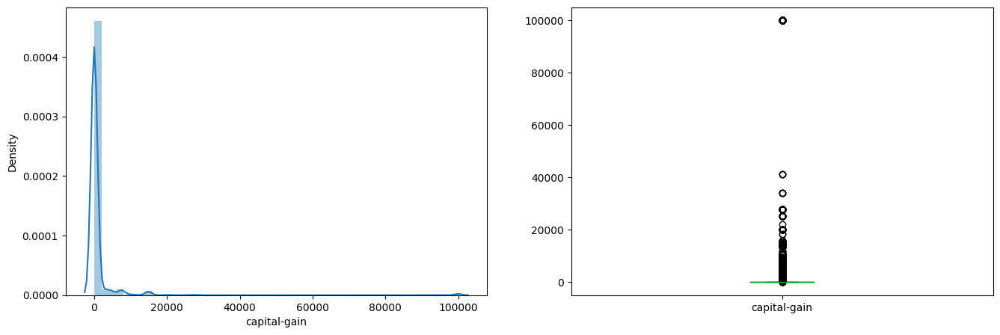

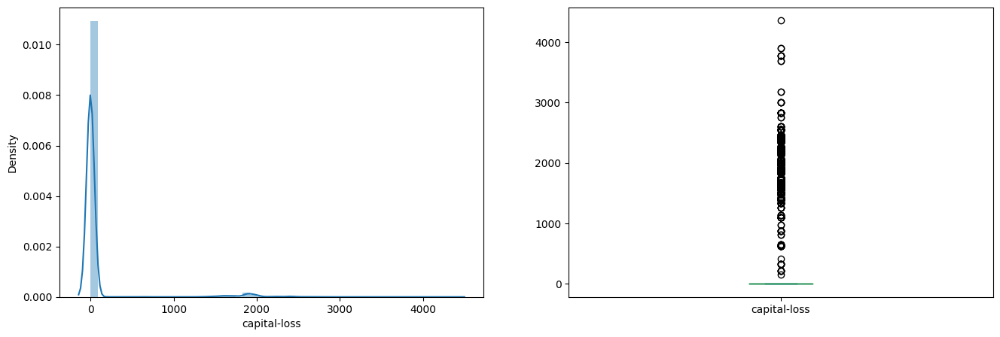

In [ ]:
# Visualize skewed continuous features of original data
data.dtypes

plt.figure(1)
plt.subplot(121)
sns.distplot(data['capital-gain']);

plt.subplot(122)
data['capital-gain'].plot.box(figsize=(16,5))
plt.show()

plt.figure(1)
plt.subplot(121)
sns.distplot(data['capital-loss']);

plt.subplot(122)
data['capital-loss'].plot.box(figsize=(16,5))
plt.show()

由于原来'capital-gain'以及'capital-loss'都有数据等于0，在转换成为 log 的时候会导致不正常的数，所以在转换的时候，现将所有的'cpaital-gain' 以及 'capital-loss' 数据加一再取log，转换成为新的两列

之后根据这两列进行 distribution 以及 box 图的绘制

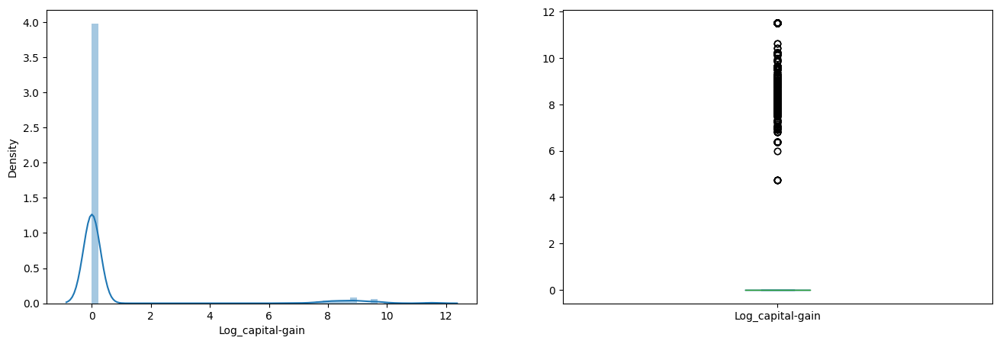

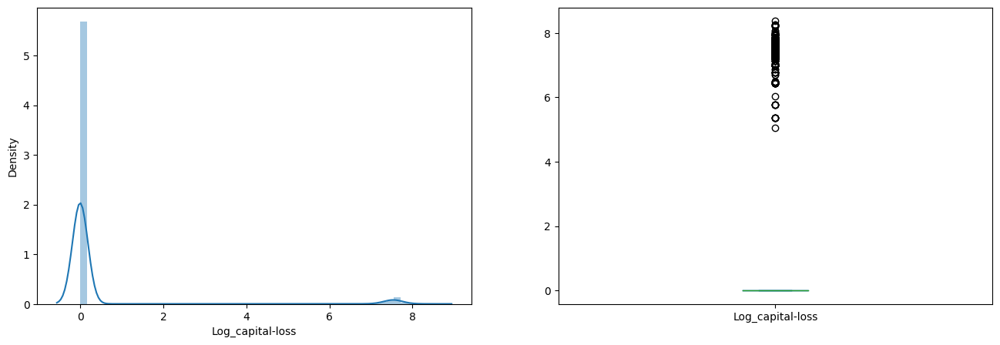

In [ ]:
# Outliers Treatment

data['Log_capital-gain'] = np.log(data['capital-gain'] + 1)
data['Log_capital-loss'] = np.log(data['capital-loss'] + 1)


plt.figure(1)
plt.subplot(121)
sns.distplot(data['Log_capital-gain']);

plt.subplot(122)
data['Log_capital-gain'].plot.box(figsize=(16,5))
plt.show()

plt.figure(1)
plt.subplot(121)
sns.distplot(data['Log_capital-loss']);

plt.subplot(122)
data['Log_capital-loss'].plot.box(figsize=(16,5))
plt.show()

首先通过 data.dtypes 查看各元数据的数据类型

再将数值数据进行归一化

之后将各分类数据通过 get_dummies 方法转换成为数值数据，完成 one-hot 编码


In [ ]:
#  Data Transformation
data.dtypes

data_copy = data.copy()

numeral = ['capital-gain','capital-loss','hours-per-week']
Z_numeral = ['Z_capital-gain','Z_capital-loss','Z_hours-per-week']

from sklearn.preprocessing import StandardScaler

data_copy[Z_numeral] = StandardScaler().fit_transform(data_copy[numeral])

data_copy.head()

# # Perform one-hot encoding on the data

data_copy = pd.get_dummies(data_copy, columns=['workclass','education_level', 'marital-status', 'occupation',
 'relationship', 'race', 'sex', 'native-country', 'income'],drop_first=True)

data_copy.head()




,age,education-num,capital-gain,capital-loss,hours-per-week,Log_capital-gain,Log_capital-loss,Z_capital-gain,Z_capital-loss,Z_hours-per-week,...,native-country_ Puerto-Rico,native-country_ Scotland,native-country_ South,native-country_ Taiwan,native-country_ Thailand,native-country_ Trinadad&Tobago,native-country_ United-States,native-country_ Vietnam,native-country_ Yugoslavia,income_>50K
0,39,13.0,2174.0,0.0,40.0,7.684784,0.0,0.142888,-0.21878,-0.078120,...,0,0,0,0,0,0,1,0,0,0
1,50,13.0,0.0,0.0,13.0,0.000000,0.0,-0.146733,-0.21878,-2.326738,...,0,0,0,0,0,0,1,0,0,0
2,38,9.0,0.0,0.0,40.0,0.000000,0.0,-0.146733,-0.21878,-0.078120,...,0,0,0,0,0,0,1,0,0,0
3,53,7.0,0.0,0.0,40.0,0.000000,0.0,-0.146733,-0.21878,-0.078120,...,0,0,0,0,0,0,1,0,0,0
4,28,13.0,0.0,0.0,40.0,0.000000,0.0,-0.146733,-0.21878,-0.078120,...,0,0,0,0,0,0,0,0,0,0


### Exercise 3 Shuffle and Split Data

首先将需要预测的 'income_>50K' 属性赋值给 Y 并将其从 X 中去除

之后，将数据按照训练集:测试集 = 8:2 的比例进行划分

最终将36177 条数据用作训练集，9045条数据用作测试集

In [ ]:
# Split the 'feature' and 'income' data into training and testing sets
from sklearn.model_selection import train_test_split
data_copy.head()
Y = data_copy['income_>50K']
X = data_copy.drop('income_>50K', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X,Y,train_size=0.8, random_state =0)

print("The shape of X_train is:", X_train.shape)
print("The shape of X_test is:", X_test.shape)

print('')
print("The shape of y_train is:", y_train.shape)
print("The shape of y_test is:", y_test.shape)


The shape of X_train is: (36177, 100)
The shape of X_test is: (9045, 100)

The shape of y_train is: (36177,)
The shape of y_test is: (9045,)


### Exercise 4 A Simple Model
What would the accuracy and F-score be on this dataset if we chose a model that always predicted an individual made more than $50,000

since $ACC = \frac{TP+TN}{TP+FP+TN+FN}$, and when the model always predicted and individual made more than $50,000, then TN=FN=0, 
$ACC = Precision = TP/(TP + FP)$，according to the result in Exercise 1, the accuracy is 0.2478, which is lower than the normal model like Logistic Regression Model.

As for the F-score, since the FN = 0 when the model always predicted and individual made more than $50,000, so the F-score is 1, which is higher then the normal model like the Logistic Regression Model.

In [ ]:
#What would the accuracy and F-score be on this dataset if we chose a model that always predicted an individual made more than $50,000
accuracy = 0.2478439697492371
f_score = 1


### Exercise 5 Evaluating Model
The following are some of the supervised learning models that are currently available in `scikit-learn`:
- Gaussian Naive Bayes (GaussianNB)
- Decision Trees
- Ensemble Methods (Bagging, AdaBoost, RandomForest)
- K-Nearest Neighbors
- Support Vector Machines (SVM)
- Logistic Regression


You need choose three of them, draw three ROC curves on the census data, and analyze and compare the them.

我选择的三个模型分别是 逻辑回归, 决策树分类器，高斯朴素贝叶斯来对收入进行预测

In [2]:
# Evaluating Model
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix, accuracy_score

model = LogisticRegression() 
model.fit(X_train,y_train) 

y_prediction = model.predict(X_test) 
print('Logistic Regression accuracy = ', metrics.accuracy_score(y_prediction,y_test))


y_pred = model.predict_proba(X_test)

fper, tper, thresholds = metrics.roc_curve(y_test, y_pred[:, 1]) 
plt.plot(fper, tper, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve of Logistic Regression')
plt.legend()
plt.show()

model = GaussianNB()

model.fit(X_train,y_train) 

y_prediction = model.predict(X_test) 

print('Gaussian Naive Bayes accuracy = ', metrics.accuracy_score(y_prediction,y_test))


y_pred = model.predict_proba(X_test)

fper, tper, thresholds = metrics.roc_curve(y_test, y_pred[:, 1]) 
plt.plot(fper, tper, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve of Gaussian Naive Bayes')
plt.legend()
plt.show()


model = DecisionTreeClassifier()

model.fit(X_train,y_train) 

y_prediction = model.predict(X_test) 

print('Decision Trees accuracy = ', metrics.accuracy_score(y_prediction,y_test))


y_pred = model.predict_proba(X_test)

fper, tper, thresholds = metrics.roc_curve(y_test, y_pred[:, 1]) 
plt.plot(fper, tper, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve of Decision Trees')
plt.legend()
plt.show()

NameError: name 'X_train' is not defined

分析使用三种分类器预测产生的 ROC 图，可以看出，在相同的 FPR 下，使用逻辑回归分类器的 TPR 要比另外两种分类器都要大，说明在census.csv 这个数据集上面，逻辑回归表现得比另外两种分类器都要好，预测结果的质量也更高。从ROC 图中看来，朴素贝叶斯分类器的表现优于决策树分类器的表现，决策树的ROC曲线相对更贴近随机分类器产生的结果，产生结果的质量不如朴素贝叶斯分类器。

### Exercise 6 Questions

#### Q1

选择的模型是决策树分类器以及随机森林分类器模型，通过 matplotlib 库里面的barh 方法绘制关于影响两种模型预测的最大影响特征因子的水平条形图，依次如下面两图所示

In [13]:
# get importance
import imp


importance = model.feature_importances_
print("shape = ", importance.shape)

indices = np.argsort(importance)[::1]   #对参数从小到大排序的索引序号取逆,即最重要特征索引——>最不重要特征索引

plt.rcParams['font.sans-serif']=['SimHei'] #用来正常显示中文标签 
plt.rcParams['axes.unicode_minus']=False #用来正常显示负号

plt.rcParams['figure.dpi'] =1600 #分辨率
plt.rcParams['figure.figsize'] = (8.0, 13.0) # 设置figure_size尺寸

ax = plt.subplot(111)
# 设置刻度字体大小
plt.xticks(fontsize=6)
plt.yticks(fontsize=6)
# 设置坐标标签字体大小
ax.set_xlabel(..., fontsize=10)
ax.set_ylabel(..., fontsize=10)

plt.barh(np.arange(importance.size), importance[indices], height=0.8)

plt.xticks(np.arange(0,0.3,0.05))
plt.yticks(np.arange(indices.size),data_copy.columns[indices])
plt.title("importance ranking of DecisionTreeClassifier")
plt.xlabel("importance")
plt.ylabel("feature")
plt.show()


model = RandomForestClassifier()

model.fit(X_train,y_train) 

y_prediction = model.predict(X_test) 

print('RandomForestClassifier accuracy = ', metrics.accuracy_score(y_prediction,y_test))

importance = model.feature_importances_

indices = np.argsort(importance)[::1]   #对参数从小到大排序的索引序号取逆,即最重要特征索引——>最不重要特征索引


ax = plt.subplot(111)
# 设置刻度字体大小
plt.xticks(fontsize=6)
plt.yticks(fontsize=6)
# 设置坐标标签字体大小
ax.set_xlabel(..., fontsize=10)
ax.set_ylabel(..., fontsize=10)

plt.barh(np.arange(importance.size), importance[indices], height=0.8)

plt.xticks(np.arange(0,0.3,0.05))
plt.yticks(np.arange(indices.size),data_copy.columns[indices])
plt.title("importance ranking of RandomForestClassifier")
plt.xlabel("importance")
plt.ylabel("feature")
plt.show()



shape =  (100,)


RandomForestClassifier accuracy =  0.8478717523493643


#### (2) Describe one real-world application in industry where a model can be applied

模型可以被用在现实工业界的比如汽车价格预测上面，可以利用汽车原材料价格，厂家选址的位置等等来预测价格

#### (3) What are the strengths of the model; when does it perform well?

由于历史的特征值以及汽车价格都已知，所以可以根据历史的特征值数据来进行对汽车价格的预测，可以比较容易地获取数据集来进行预测；

当汽车的价格和某些特征有比较明显的函数关系（如线性关系）的时候，模型预测的效果会比较好。

#### (4) What are the weaknesses of the model; when does it perform poorly?

如果使用决策树分类器进行预测，模型的缺点就是容易过拟合，导致泛化能力较差。

当汽车的价格在当前时刻受一些其他不在历史特征里面的特征（如舆论影响等等）影响较大时，模型的预测效果会表现较差。

#### (5) What makes this model a good candidate for the problem, given what you know about the data?

当数据集中汽车的价格和某些特征有比较明显的函数关系（如线性关系）的时候，模型预测的效果会比较好。
